# Содержание задания
Вариант=24	Судаков 	Евгений	 $~$X11=23	$~$X12=13	$~$SD1=3	$~$X21=13	$~$X22=8	$~$SD2=2	$~$N1=60	$~$N2=40
### Задание 1.
 - Исследуйте, как объем обучающей выборки и количество тестовых данных, влияет на точность классификации в датасетах про крестики-нолики (tic_tac_toe.txt) и о спаме e-mail сообщений (spam.csv) с помощью наивного Байесовского классификатора. 
 - Постройте графики зависимостей точности на обучающей и тестовой выборках в зависимости от их соотношения.

In [2]:
import numpy as np
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import matplotlib.pyplot as plt

In [43]:
# function to load data of tic tac toe games
def load_tic_tac_data():
    data = pd.read_csv("tic_tac_toe.txt", sep=',',header=None).to_numpy()
    X = np.delete(data, -1, axis=1)
    Y = data[:, -1]
    Y[Y == 'positive'] = 1
    Y[Y == 'negative'] = 0
    Y=Y.astype('int')
    X[X == 'b'] = 0
    X[X == 'x'] = 1
    X[X == 'o'] = 2
    X=X.astype('int')
    return X, Y

In [44]:
# function to load data of spam messages
def load_spam_data():
    data = pd.read_csv("spam.csv", sep=',').to_numpy()
    X = np.delete(data, -1, axis=1)
    Y = data[:,-1]
    Y[Y == 'spam'] = 1
    Y[Y == 'nonspam'] = 0
    Y=Y.astype('int')
    X=X.astype('float')
    return X, Y

In [45]:
def get_pred_accuracy(clf, x_test, y_test):
    # clf is classifier
    y_prediction = clf.predict(x_test)
    return accuracy_score(y_test, y_prediction)

In [46]:
X1, y1 = load_tic_tac_data()

In [47]:
X2, y2 = load_spam_data()

In [48]:
def calculate_accuracy_of_ratio(X, y):
    pred_accuracy_arr = []
    test_sizes = [i for i in np.arange(0.1, 1.0, 0.01)]
    for i in test_sizes:
        pred_accuracy_arr_tmp = np.array([])
        for j in range(100):
            # create instance of naive bayes classificator 
            gnb = GaussianNB()
            # split data on training part and test
            x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=i, random_state=j)
            # fitting the model
            y_pred = gnb.fit(x_train, y_train)
            # making prediction wiwth fitted classifier and add number to tmp arr
            pred_accuracy_arr_tmp = np.append(pred_accuracy_arr_tmp, get_pred_accuracy(gnb, x_test, y_test))
        pred_accuracy_arr.append(np.mean(pred_accuracy_arr_tmp))
    return pred_accuracy_arr, test_sizes

In [49]:
pred_accuracy_arr_tic_tac_toe, test_sizes_tic_tac_toe = calculate_accuracy_of_ratio(X1, y1)


In [50]:
pred_accuracy_arr_spam, test_sizes_spam = calculate_accuracy_of_ratio(X2, y2)


In [51]:
def plot_accuracy_of_test_sizes(pred_accuracy_arr, test_sizes, df_name):
    plt.plot(test_sizes, pred_accuracy_arr)
    plt.title(f'Accuracy of ratio test / all data : {df_name}')
    plt.ylabel('accuracy')
    plt.xlabel('ratio test / all" data ')
    plt.grid(True)
    plt.show()

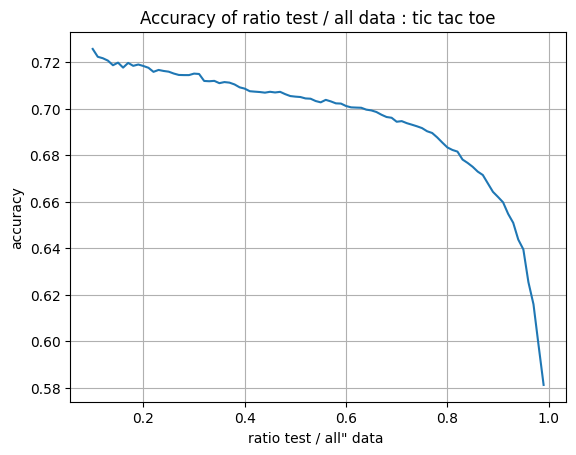

In [52]:
plot_accuracy_of_test_sizes(pred_accuracy_arr_tic_tac_toe, test_sizes_tic_tac_toe, 'tic tac toe')

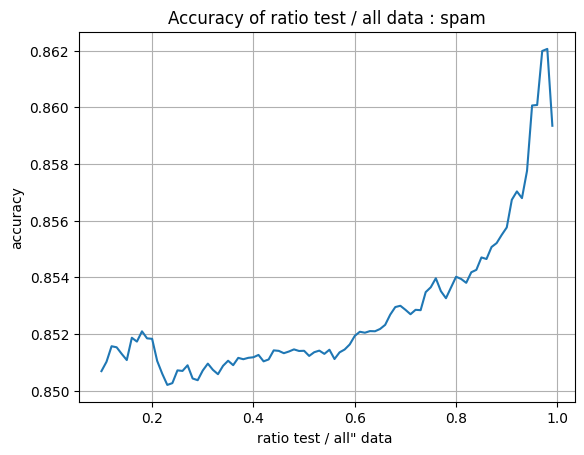

In [53]:
plot_accuracy_of_test_sizes(pred_accuracy_arr_spam, test_sizes_spam, 'spam')

### Задание 2

- Сгенерируйте 100 точек с двумя признаками X1 и X2 в соответствии с нормальным распределением так, что одна и вторая часть точек (класс -1 и класс 1) имеют параметры: мат. ожидание X1, мат. ожидание X2, среднеквадратические отклонения для обеих переменных, соответствующие вашему варианту (указан в таблице). 
- Построить диаграммы, иллюстрирующие данные.  
- Построить Байесовский классификатор и оценить качество классификации с помощью различных методов (точность, матрица ошибок, ROС и PR-кривые). Является ли построенный классификатор «хорошим»?

    * X1_1 = 23  $~~~$   X2_1 =  13
    * X2_2 = 13  $~~~$   X2_2 = 8
    * SD1 = 3   $~~~$   SD2 = 2
    * N1 = 60   $~~~$   N2 = 40

#### generate 100 points with defined params

In [11]:
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve,auc,RocCurveDisplay

In [12]:
def generate_data(x1, x2, sd, n, class_num):
    arr_11 = np.random.normal(x1, sd, n).reshape(-1,1)
    arr_12 = np.random.normal(x2, sd, n).reshape(-1,1)

    X = np.concatenate((arr_11, arr_12), axis=1)
    Y = np.full(n, class_num)
    return X, Y

In [15]:
# # class -1

# x1_1 = 23
# x2_1 = 13
# N1 = 60
# sd_1 = 3

# X1, Y1 = generate_data(x1_1, x2_1,sd_1, N1, -1)


In [16]:
# # class 1

# x1_2 = 13
# x2_2 = 8
# N2 = 40
# sd_2 = 2

# X2, Y2 = generate_data(x1_2, x2_2, sd_2, N2, 1)


In [ ]:
Novikov

In [27]:

x1_1 = 12
x2_1 = 23
N1 = 50
sd_1 = 3

X1, Y1 = generate_data(x1_1, x2_1,sd_1, N1, -1)

In [28]:
x1_2 = 7
x2_2 = 10
N2 = 50
sd_2 = 2

X2, Y2 = generate_data(x1_2, x2_2, sd_2, N2, 1)

In [ ]:
Dimitruk

In [13]:
# x1_1 = 19
# x2_1 = 8
# N1 = 70
# sd_1 = 4

# X1, Y1 = generate_data(x1_1, x2_1,sd_1, N1, -1)

In [17]:
# x1_2 = 14
# x2_2 = 6
# N2 = 30
# sd_2 = 4

# X2, Y2 = generate_data(x1_2, x2_2, sd_2, N2, 1)

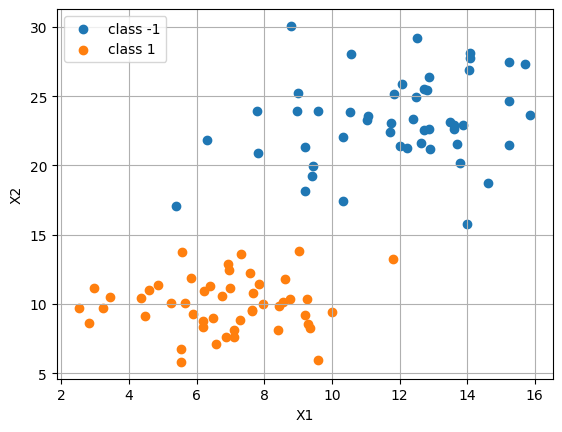

In [29]:
def plot_diagram():  
    plt.figure()

    plt.scatter(X1[:, 0], X1[:, 1])
    plt.scatter(X2[:, 0], X2[:, 1])

    plt.xlabel('X1')
    plt.ylabel('X2')
    
    legend = ('class -1', 'class 1')
    plt.legend(legend)
    plt.grid(True)

    plt.show()

plot_diagram()

Build bayes classifier and check different metrics for it

In [33]:
X_task_2 = np.concatenate((X1, X2), axis=0)
y_task_2 = np.concatenate((Y1, Y2), axis=0)

X_train, X_test, y_train, y_test = train_test_split(X_task_2, y_task_2, test_size=0.3, random_state=15)


In [34]:
# clf2 -- classifier for task 2
gnb_clf_task2 = GaussianNB()
y_pred = gnb_clf_task2.fit(X_train, y_train)

get_pred_accuracy(gnb_clf_task2, X_test, y_test )

0.9666666666666667

In [35]:
def plot_ROC():
    pred = gnb_clf_task2.predict(X_test)

    plt.figure(figsize=(5, 5))

    fpr, tpr, thresholds = roc_curve(y_test, pred)
    roc_auc = auc(fpr, tpr)
    display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='GaussianNB')
    display.plot()
    plt.plot([0, 1], [0, 1], linestyle='--')

    plt.show()

In [36]:
def plot_confusion_table(clf, x_test, y_test): 
    predictions = clf.predict(x_test)
    conf_matrx= confusion_matrix(y_test, predictions, labels=clf.classes_)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrx,display_labels=clf.classes_)
    disp.plot()

    plt.show()

In [37]:
def plot_PR(clf):   
    probs = clf.predict_proba(X_test)
#     print(probs)
    probs = probs[:, 1]
    prec, recall, _ = precision_recall_curve(y_test, probs)
    no_skill = len(y_test[y_test==1]) / len(y_test)
    plt.plot(recall, prec)
    plt.plot([0, 1], [no_skill, no_skill], linestyle='--')
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.show()

<Figure size 500x500 with 0 Axes>

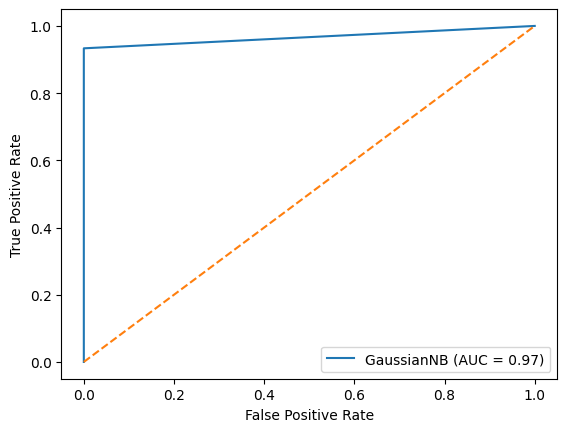

In [38]:
plot_ROC()


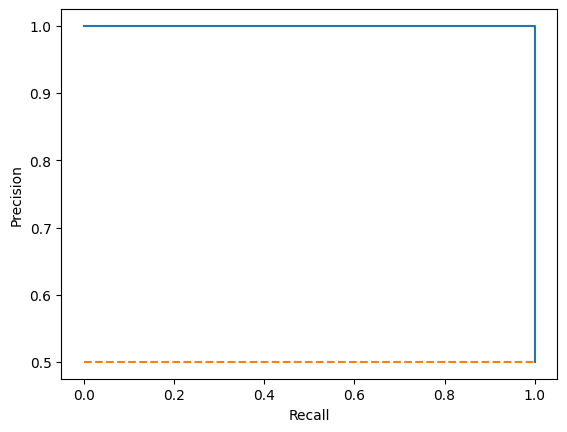

In [40]:
plot_PR(gnb_clf_task2)


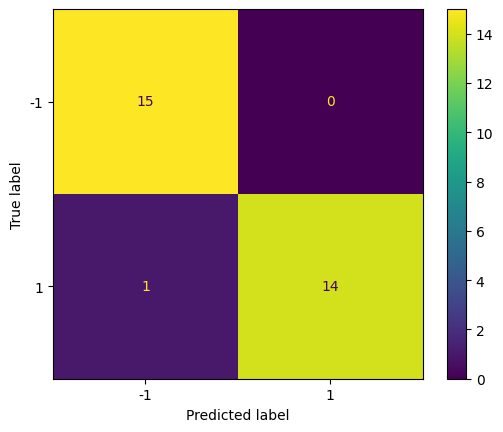

In [41]:
plot_confusion_table(gnb_clf_task2, X_test, y_test)


### Задание 3.	

Постройте классификатор на основе метода k ближайших соседей для обучающего множества Glass (glass.csv). Посмотрите заголовки признаков и классов. Перед построением классификатора необходимо также удалить первый признак Id number, который не несет никакой информационной нагрузки. 

    a. Постройте графики зависимости ошибки классификации от количества ближайших соседей.
    
    b. Определите подходящие метрики расстояния и исследуйте, как тип метрики расстояния 
    влияет на точность классификации.
    
    c. Определите, к какому типу стекла относится экземпляр с характеристиками:
    RI =1.516 Na =11.7 Mg =1.01 Al =1.19 Si =72.59 K=0.43 Ca =11.44 Ba =0.02 Fe =0.1

In [26]:
from sklearn.neighbors import KNeighborsClassifier

In [27]:
def load_glass_data():
    nparr = pd.read_csv('glass.csv', sep=',').to_numpy()
    Y = nparr[:, -1] 
    Y = Y.astype('int')
    #delete first useless feature  Id number
    X = np.delete(nparr,[0,-1], axis=1)
    X=X.astype('float')
    return X, Y 

In [28]:
X_task_3, y_task_3 = load_glass_data()
X_train_task_3, X_test_task_3, y_train_task_3, y_test_task_3 = train_test_split(X_task_3, y_task_3, test_size=0.20)

In [29]:
k_neighbors = np.arange(1,101)

In [30]:
def get_pred_accuracy_arr(k_neighbors):
    pred_accuracy_arr = []
    for i in k_neighbors:
        clf = KNeighborsClassifier(n_neighbors=i)
        clf.fit(X_train_task_3, y_train_task_3)
        pred_accuracy_arr.append(get_pred_accuracy(clf, X_test_task_3, y_test_task_3))
    return pred_accuracy_arr

In [32]:
def plot_accuracy_num_of_neigbors(k_neighbors,pred_accuracy_arr):
    plt.plot(k_neighbors, pred_accuracy_arr)
    plt.ylabel('accuracy')
    plt.xlabel('number of neighbors')
    plt.show()

#### a) график зависимости ошибки классификации от количества ближайших соседей.

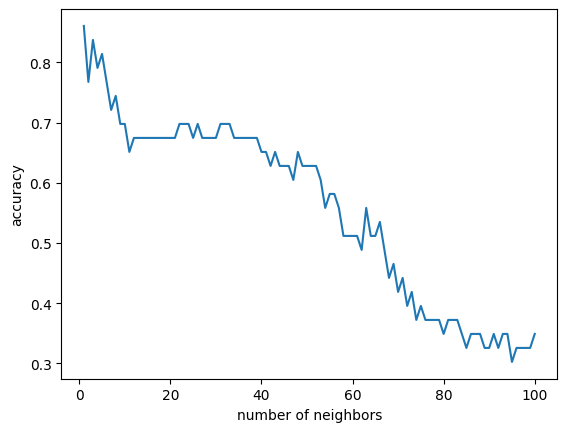

In [33]:
pred_accuracy_arr_task_3a = get_pred_accuracy_arr(k_neighbors)
plot_accuracy_num_of_neigbors(k_neighbors, pred_accuracy_arr_task_3a)

#### b) определите подходящие метрики расстояния и исследуйте, как тип метрики расстояния влияет на точность классификации


In [34]:
def get_dependency_of_knn_metric_to_accuracy():
    metrics = ['chebyshev','euclidean','manhattan', 'minkowski', 'cosine', 'jaccard', 'hamming', ]
    prediction_acc_arr = []
    for i in metrics: 
        knn_clf = KNeighborsClassifier(n_neighbors=15, metric=i)
        knn_clf.fit(X_train_task_3, y_train_task_3)
        prediction_acc_arr.append(get_pred_accuracy(knn_clf, X_test_task_3, y_test_task_3))
    return metrics, prediction_acc_arr

In [35]:
metrics, pred_accuracy_arr_task_3b = get_dependency_of_knn_metric_to_accuracy()


In [36]:
def plot_dependency_knn_metric_to_accuracy():
    x_ticks_labels = metrics
    
    plt.xlabel('metrics')
    plt.ylabel('accuracy')
    plt.bar(range(len(pred_accuracy_arr_task_3b)), pred_accuracy_arr_task_3b, align='center')
    plt.xticks(range(len(metrics)), metrics, size='small', rotation='vertical')
    plt.show()

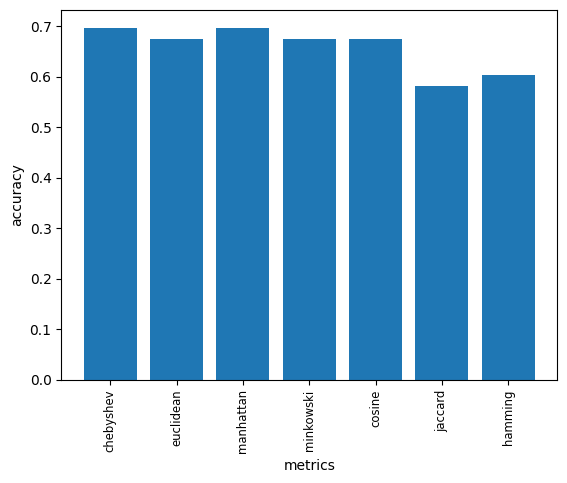

In [37]:
plot_dependency_knn_metric_to_accuracy()

#### c) Определите, к какому типу стекла относится экземпляр с характеристиками:
RI =1.516 Na =11.7 Mg =1.01 Al =1.19 Si =72.59 K=0.43 Ca =11.44 Ba =0.02 Fe =0.1

In [38]:
X_test_task_3c = np.array([1.516, 11.7, 1.01, 1.19, 72.59, 0.43, 11.44, 0.02, 0.1]).reshape(1, -1)

In [39]:
knn_clf_task_3c  = KNeighborsClassifier(5)
knn_clf_task_3c.fit(X_train_task_3, y_train_task_3)
prediction = knn_clf_task_3c.predict(X_test_task_3c)
print('Prediction res:', prediction[0])

Prediction res: 5


### Задание 4.	
 Постройте классификаторы на основе метода опорных векторов для наборов данных из файлов svmdataN.txt и svmdataNtest.txt, где N –  индекс задания:

    a.	Постройте алгоритм метода опорных векторов с линейным ядром. Визуализируйте разбиение пространства признаков на области с помощью полученной модели (пример визуализации). Выведите количество полученных опорных векторов, а также матрицу ошибок классификации на обучающей и тестовой выборках.
    
    b.	Постройте алгоритм метода опорных векторов с линейным ядром. Добейтесь нулевой ошибки сначала на обучающей выборке, а затем на тестовой, путем изменения штрафного параметра. Выберите оптимальное значение данного параметра и объясните свой выбор. Всегда ли нужно добиваться минимизации ошибки на обучающей выборке?
    
    c.	Постройте алгоритм метода опорных векторов, используя различные ядра (линейное, полиномиальное степеней 1-5, сигмоидальная функция, гауссово). Визуализируйте разбиение пространства признаков на области с помощью полученных моделей. Сделайте выводы.
    
    d.	Постройте алгоритм метода опорных векторов, используя различные ядра (полиномиальное степеней 1-5, сигмоидальная функция, гауссово). Визуализируйте разбиение пространства признаков на области с помощью полученных моделей. Сделайте выводы.
    
    e.	Постройте алгоритм метода опорных векторов, используя различные ядра (полиномиальное степеней 1-5, сигмоидальная функция, гауссово). Изменяя значение параметра ядра (гамма), продемонстрируйте эффект переобучения, выполните при этом визуализацию разбиения пространства признаков на области.
  

In [40]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import svm
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


In [41]:
def load_svm_data(task_letter):
    svm_train = pd.read_csv(f'svmdata_{task_letter}.txt', sep='\t').to_numpy()
    
    X_train = svm_train[:, :-1]
    X_train = X_train.astype('float')
    
    y_train = svm_train[:, -1]
    y_train[y_train=='red'] = 0
    y_train[y_train=='green'] = 1
    y_train = y_train.astype('int')

    
    svm_test = pd.read_csv(f'svmdata_{task_letter}_test.txt', sep='\t').to_numpy()
    
    X_test = svm_test[:, :-1]
    X_test = X_test.astype('float')
    
    y_test = svm_test[:, -1]
    y_test[y_test=='red'] = 0
    y_test[y_test=='green'] = 1
    y_test = y_train.astype('int')
    
    return X_train, y_train, X_test, y_test


In [42]:
def make_meshgrid(x, y, h=.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(clf, xx, yy, ax=plt, **params):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

In [43]:
# building scatter plot for 2D data
def build_scatter(clf, x_test, y_test, size: tuple = None, x_label = 'X1', y_label = 'X2', title='title'):
    X0, X1 = x_test[:, 0], x_test[:, 1]
    xx, yy = make_meshgrid(X0, X1)

    plt.figure(figsize=size)
    
    plt.title(title)
    plot_contours(clf, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    plt.scatter(X0, X1, c=y_test, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())

    plt.xlabel(x_label)
    plt.ylabel(y_label)

    plt.xticks(())
    plt.yticks(())
    plt.show()

#### a.	Постройте алгоритм метода опорных векторов с линейным ядром. Визуализируйте разбиение пространства признаков на области с помощью полученной модели (пример визуализации). Выведите количество полученных опорных векторов, а также матрицу ошибок классификации на обучающей и тестовой выборках.

In [44]:
X_train_a, y_train_a, X_test_a, y_test_a = load_svm_data('a')

In [45]:
svc_clf_a = svm.SVC(kernel='linear', gamma='auto')

In [46]:
svc_clf_a.fit(X_train_a, y_train_a)

SVC(gamma='auto', kernel='linear')

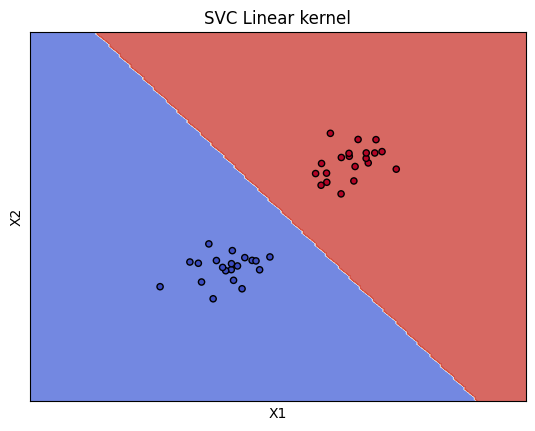

In [47]:
build_scatter(svc_clf_a, X_test_a, y_test_a, x_label='X1', y_label='X2', title='SVC Linear kernel')

In [48]:
print('Number of vectors: ', len(svc_clf_a.support_vectors_), '\n\n Support vectors: \n', svc_clf_a.support_vectors_)

Number of vectors:  6 

 Support vectors: 
 [[0.14874741 0.13128834]
 [0.18027464 0.29152253]
 [0.20454273 0.00740181]
 [0.90356343 0.72236951]
 [0.98510067 0.68430049]
 [0.80835351 0.82126184]]


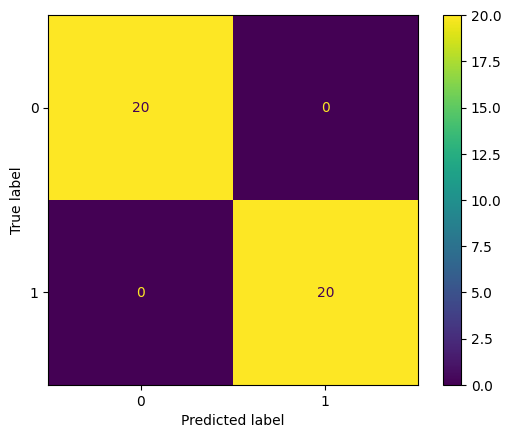

In [51]:
plot_confusion_table(svc_clf_a, X_train_a, y_train_a)

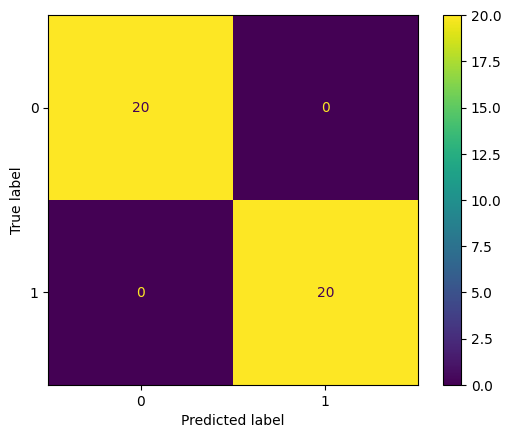

In [50]:
plot_confusion_table(svc_clf_a, X_test_a, y_test_a )

#### b. Постройте алгоритм метода опорных векторов с линейным ядром. Добейтесь нулевой ошибки сначала на обучающей выборке, а затем на тестовой, путем изменения штрафного параметра. Выберите оптимальное значение данного параметра и объясните свой выбор. Всегда ли нужно добиваться минимизации ошибки на обучающей выборке?

In [52]:
X_train_b, y_train_b, X_test_b, y_test_b = load_svm_data('b')

In [53]:
svc_clf_b = svm.SVC(kernel='linear', gamma='auto')

In [54]:
svc_clf_b.fit(X_train_b, y_train_b)

SVC(gamma='auto', kernel='linear')

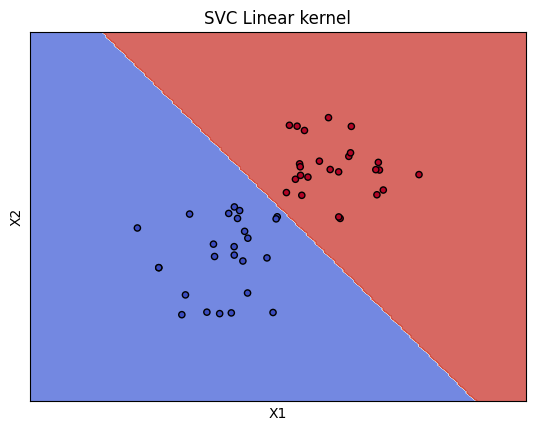

In [55]:
build_scatter(svc_clf_a, X_test_b, y_test_b, x_label='X1', y_label='X2', title='SVC Linear kernel')

In [56]:
def find_C_param_for_1_accuracy_train_sample():
    C_params = np.arange(0.0000000001, 1000)
    pred_acc_arr = []
    C_first_optimal  = 0
    first = True
    for i in C_params:
        svc_clf = svm.SVC(kernel='linear', C=i)
        svc_clf.fit(X_train_b, y_train_b)
        pred = get_pred_accuracy(svc_clf, X_train_b, y_train_b)
        if pred == 1 and first: 
            C_first_optimal = i
            first = False
        pred_acc_arr.append(pred)
    return C_params, pred_acc_arr, C_first_optimal

In [57]:
c_params, pred_acc_arr_task_4_b, C_first_optimal = find_C_param_for_1_accuracy_train_sample()
print ("First optimal C param: ", C_first_optimal)

First optimal C param:  483.0000000001


In [58]:
def plot_accuracy_of_C_param(c_params, pred_acc_arr_task_4_b):
    plt.plot(c_params, pred_acc_arr_task_4_b)
    plt.title('Accuracy of C param')
    plt.xlabel('C')
    plt.ylabel('accuracy')
    plt.show()

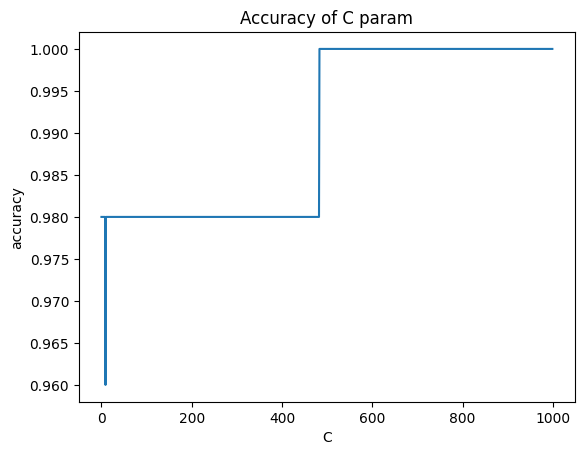

In [59]:
plot_accuracy_of_C_param(c_params, pred_acc_arr_task_4_b)

In [60]:
def find_C_param_for_1_accuracy_test_sample():
    C_params = np.arange(10, 1000)
    pred_acc_arr = []
    C_first_optimal  = 0
    first = True
    for i in C_params:
        svc_clf = svm.SVC(kernel='linear', C=i)
        svc_clf.fit(X_train_b, y_train_b)
        pred = get_pred_accuracy(svc_clf, X_test_b, y_test_b)
        if pred == 1 and first: 
            C_first_optimal = i
            first = False
        pred_acc_arr.append(pred)
    return C_params, pred_acc_arr, C_first_optimal

First optimal C param:  10


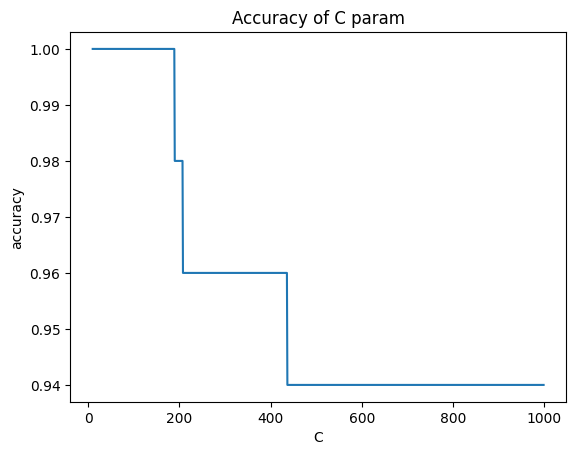

In [61]:
c_params_test, pred_acc_arr_task_4_b_test, C_first_optimal_test = find_C_param_for_1_accuracy_test_sample()
print ("First optimal C param: ", C_first_optimal_test)
plot_accuracy_of_C_param(c_params_test, pred_acc_arr_task_4_b_test)

#### c. Постройте алгоритм метода опорных векторов, используя различные ядра (линейное, полиномиальное степеней 1-5, сигмоидальная функция, гауссово). Визуализируйте разбиение пространства признаков на области с помощью полученных моделей. Сделайте выводы.

In [62]:
X_train_c, y_train_c, X_test_c, y_test_c = load_svm_data('c')

In [63]:
def get_pred_acc_arr_svm(models, x_test, y_test):
    pred_acc_arr = []
    for clf in models:
        pred_acc_arr.append(get_pred_accuracy(clf, x_test, y_test))
    return pred_acc_arr

In [64]:
from sklearn.inspection import DecisionBoundaryDisplay

In [65]:
def plot_svm_with_different_kernels(models, titles, X_test, y_test):
    fig, sub = plt.subplots(4, 2, figsize=(15, 15))
    plt.subplots_adjust(wspace=.5, hspace=.3)

    X0, X1 = X_test[:, 0], X_test[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    
    for clf, title, ax, i in zip(models, titles, sub.flatten(), range(len(models))):
        plot_contours(clf, xx, yy, ax,
                      cmap=plt.cm.coolwarm, alpha=0.8)
        ax.scatter(X0, X1, c=y_test, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xlabel('X1')
        ax.set_ylabel('X2')
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(title)
    plt.show()

In [66]:
C = 1.0  # SVM regularization parameter
models_c = (
    svm.SVC(kernel="linear", C=C),
    svm.SVC(kernel="rbf", C=C),
    svm.SVC(kernel="poly", degree=1, C=C),
    svm.SVC(kernel="poly", degree=2, C=C),
    svm.SVC(kernel="poly", degree=3, C=C),
    svm.SVC(kernel="poly", degree=4, C=C),
    svm.SVC(kernel="poly", degree=5, C=C),
    svm.SVC(kernel="sigmoid", C=C)
)


In [67]:
# title for the plots
titles_c = (
    "SVC with linear kernel",
    "SVC with RBF kernel",
    "SVC with polynomial (degree 1) kernel",
    "SVC with polynomial (degree 2) kernel",
    "SVC with polynomial (degree 3) kernel",
    "SVC with polynomial (degree 4) kernel",
    "SVC with polynomial (degree 5) kernel",
    "SVC with sigmoid kernel"
)

In [68]:
models_c = [clf.fit(X_train_c, y_train_c) for clf in models_c]
acc_arr_c = get_pred_acc_arr_svm(models_c, X_test_c, y_test_c)
for i in range(len(models_c)):
    print(titles_c[i],'\t accuracy: ', acc_arr_c[i])


SVC with linear kernel 	 accuracy:  0.56
SVC with RBF kernel 	 accuracy:  0.56
SVC with polynomial (degree 1) kernel 	 accuracy:  0.52
SVC with polynomial (degree 2) kernel 	 accuracy:  0.46
SVC with polynomial (degree 3) kernel 	 accuracy:  0.4
SVC with polynomial (degree 4) kernel 	 accuracy:  0.42
SVC with polynomial (degree 5) kernel 	 accuracy:  0.46
SVC with sigmoid kernel 	 accuracy:  0.54


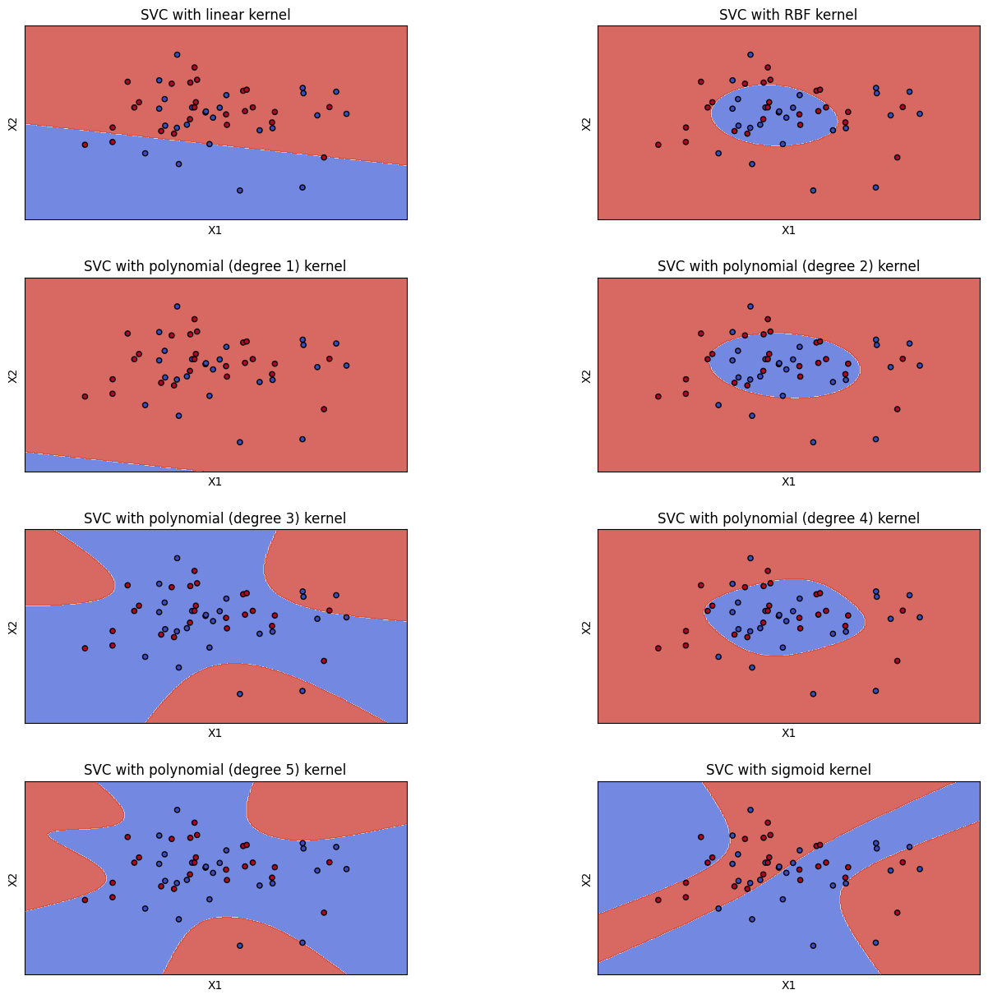

In [69]:
plot_svm_with_different_kernels(models_c, titles_c, X_test_c, y_test_c)

#### d.	Постройте алгоритм метода опорных векторов, используя различные ядра (полиномиальное степеней 1-5, сигмоидальная функция, гауссово). Визуализируйте разбиение пространства признаков на области с помощью полученных моделей. Сделайте выводы.

In [70]:
def load_train_test(t):
    nparr = pd.read_csv('svmdata_'+ t + '.txt', delimiter='\t').to_numpy()
    nparr_test = pd.read_csv('svmdata_'+ t + '_test.txt', delimiter='\t').to_numpy()
    np.random.shuffle(nparr)
    np.random.shuffle(nparr_test)
    return nparr, nparr_test
def get_X_Y(arr):
    Y = arr[:, -1]
    Y[Y == 'red'] = 0
    Y[Y == 'green'] = 1
    Y=Y.astype('int')

    X = np.delete(arr, [len(arr[0]) - 1], axis=1)
    X=X.astype('float')
    return X, Y

In [71]:
# X_train_d, y_train_d, X_test_d, y_test_d = load_svm_data('d')
nparr, nparr_test = load_train_test('e')
X_train_d, y_train_d = get_X_Y(nparr)
X_test_d, y_test_d = get_X_Y(nparr_test)

In [72]:
C = 1.0  # SVM regularization parameter
models_d = (
    svm.SVC(kernel="poly", degree=1, gamma='auto', C=C),
    svm.SVC(kernel="poly", degree=2,  gamma='auto', C=C),
    svm.SVC(kernel="poly", degree=3,  gamma='auto', C=C),
    svm.SVC(kernel="poly", degree=4,  gamma='auto', C=C),
    svm.SVC(kernel="poly", degree=5,  gamma='auto', C=C),
    svm.SVC(kernel="sigmoid", C=C),
    svm.SVC(kernel="rbf", C=C)
)


In [73]:
# title for the plots
titles_d = (
    "SVC with polynomial (degree 1) kernel",
    "SVC with polynomial (degree 2) kernel",
    "SVC with polynomial (degree 3) kernel",
    "SVC with polynomial (degree 4) kernel",
    "SVC with polynomial (degree 5) kernel",
    "SVC with sigmoid kernel",
    "SVC with RBF kernel",
)

In [74]:
models_d = [clf.fit(X_train_d, y_train_d) for clf in models_d]
acc_arr_d = get_pred_acc_arr_svm(models_d, X_test_d, y_test_d)
for i in range(len(models_d)):
    print(titles_d[i],'\t accuracy: ', acc_arr_d[i])

SVC with polynomial (degree 1) kernel 	 accuracy:  0.65
SVC with polynomial (degree 2) kernel 	 accuracy:  0.9083333333333333
SVC with polynomial (degree 3) kernel 	 accuracy:  0.5333333333333333
SVC with polynomial (degree 4) kernel 	 accuracy:  0.6916666666666667
SVC with polynomial (degree 5) kernel 	 accuracy:  0.48333333333333334
SVC with sigmoid kernel 	 accuracy:  0.5166666666666667
SVC with RBF kernel 	 accuracy:  0.9166666666666666


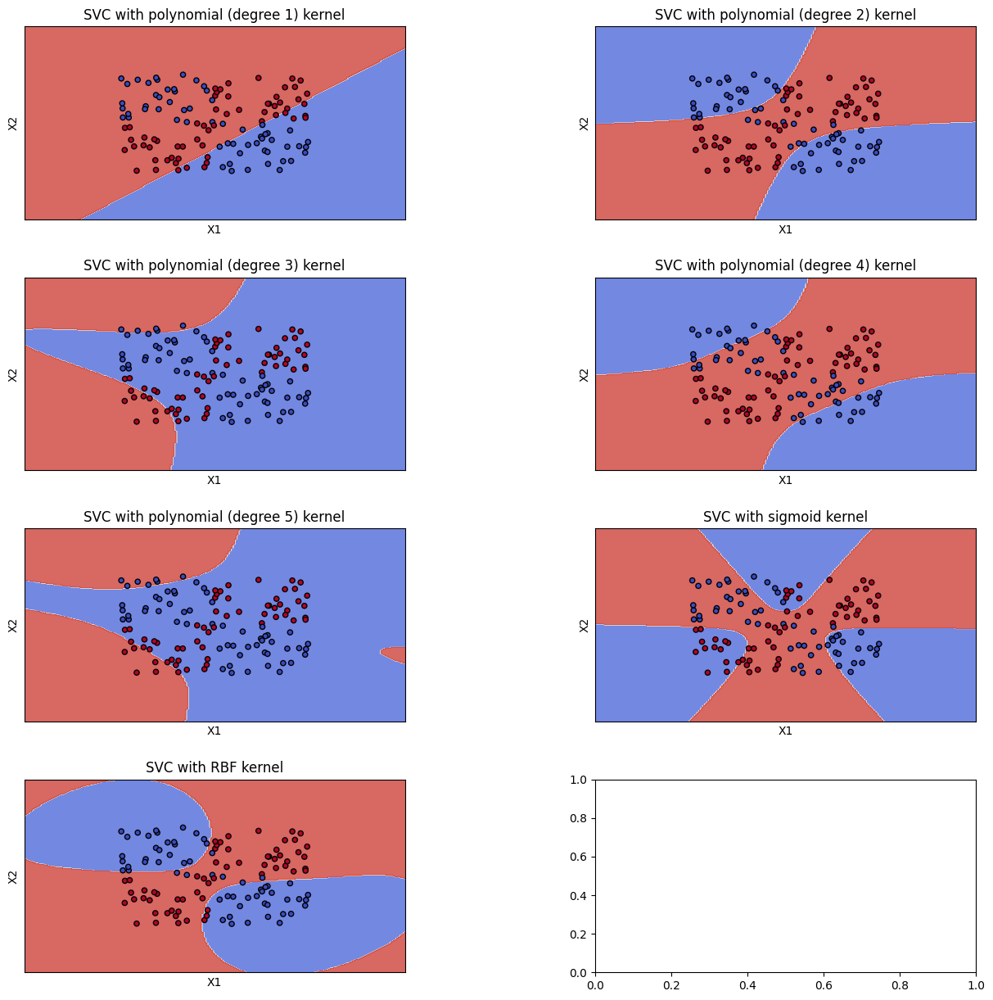

In [75]:
plot_svm_with_different_kernels(models_d, titles_d, X_test_d, y_test_d)

#### e.	Постройте алгоритм метода опорных векторов, используя различные ядра (полиномиальное степеней 1-5, сигмоидальная функция, гауссово). Изменяя значение параметра ядра (гамма), продемонстрируйте эффект переобучения, выполните при этом визуализацию разбиения пространства признаков на области.

In [76]:
from tqdm import tqdm

In [77]:
nparr, nparr_test = load_train_test('e')
X_train_e, y_train_e = get_X_Y(nparr)
X_test_e, y_test_e = get_X_Y(nparr_test)

In [ ]:
# X_train_e, y_train_e, X_test_e, y_test_e = load_svm_data('e')

In [ ]:
# C = 1.0  # SVM regularization parameter
# models_e = (
#     svm.SVC(kernel="poly", degree=1, gamma=10000, C=C),
#     svm.SVC(kernel="poly", degree=2,  gamma=200, C=C),
#     svm.SVC(kernel="poly", degree=3,  gamma=10, C=C),
#     svm.SVC(kernel="poly", degree=4,  gamma=550, C=C),
#     svm.SVC(kernel="poly", degree=5,  gamma=50, C=C),
#     svm.SVC(kernel="sigmoid", gamma=3300, C=C),
#     svm.SVC(kernel="rbf",gamma=5000, C=C)
# )

In [79]:
C = 1.0 # SVM regularization parameter
g_s = [ 100, 2000, 300, 30000]

print('working')

models_e = (
            svm.SVC(kernel="poly", degree=2,  gamma=g_s[0], C=C),
            svm.SVC(kernel="poly", degree=4,  gamma='auto', C=C),
            svm.SVC(kernel="sigmoid", gamma=g_s[2], C=C),
            svm.SVC(kernel="rbf",gamma=g_s[3], C=C)
           )
titles_e = (
            'SVC with polynomial (degree 2) kernel',
            'SVC with polynomial (degree 4) kernel',
            'SVC with Sigmoid kernel',
            'SVC with RBF kernel',) 
            
for clf, i in zip(models_e, range((len(models_e)))):
    clf.fit(X_train_e, y_train_e)
    print(i, 'trained')

working
0 trained
1 trained
2 trained
3 trained


In [ ]:
# models_e = [clf.fit(X_train_e, y_train_e) for clf in tqdm(models_e)]


In [80]:
acc_arr_e = get_pred_acc_arr_svm(models_e, X_test_e, y_test_e)
for i in range(len(models_e)):
    print(titles_e[i],'\t accuracy: ', acc_arr_e[i])

SVC with polynomial (degree 2) kernel 	 accuracy:  0.9666666666666667
SVC with polynomial (degree 4) kernel 	 accuracy:  0.6916666666666667
SVC with Sigmoid kernel 	 accuracy:  0.5
SVC with RBF kernel 	 accuracy:  0.5666666666666667


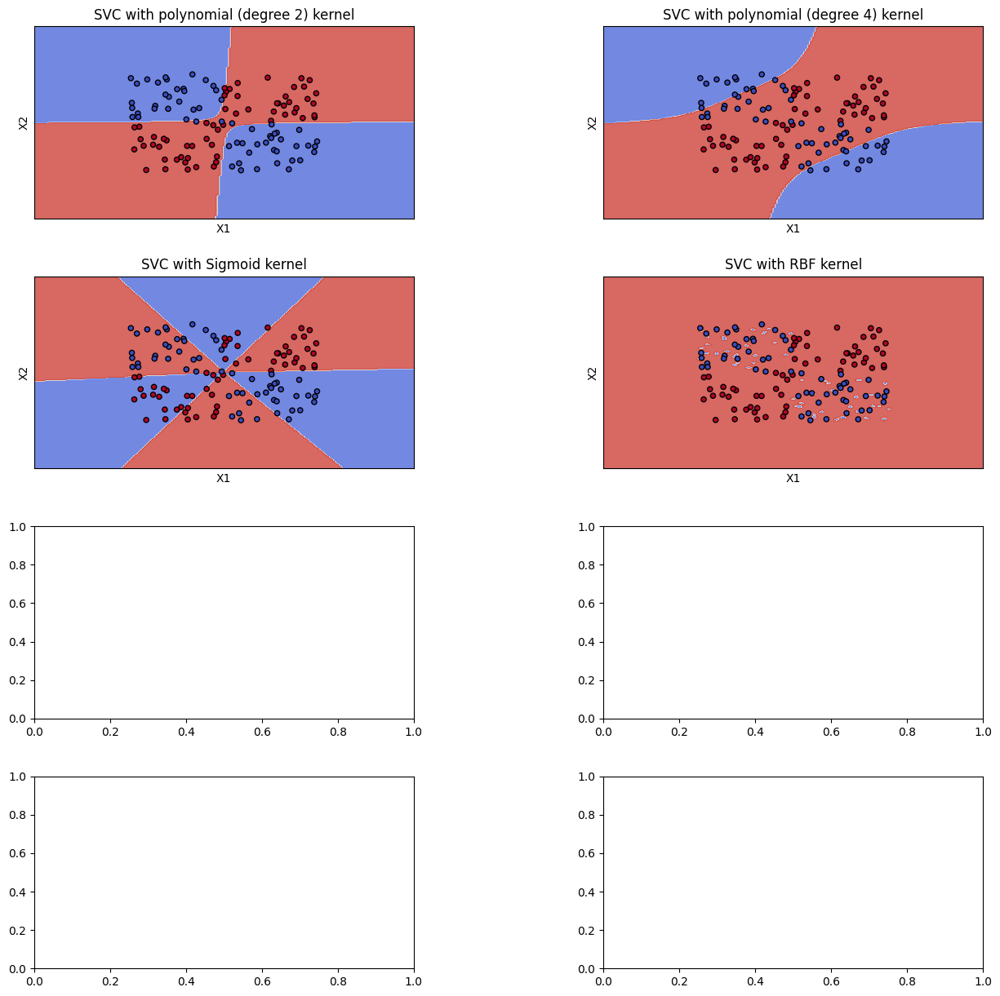

In [81]:
plot_svm_with_different_kernels(models_e, titles_e, X_test_e, y_test_e )

  ### Задание 5.	
 Постройте классификаторы для различных данных на основе деревьев решений:

    a.	Загрузите набор данных Glass из файла glass.csv.Постройте дерево классификации для модели, предсказывающей тип (Type) по остальным признакам. Визуализируйте результирующее дерево решения. Дайте интерпретацию полученным результатам. Является ли построенное дерево избыточным? Исследуйте зависимость точности классификации от критерия расщепления, максимальной глубины дерева и других параметров по вашему усмотрению.
    
    b.	Загрузите набор данных spam7 из файла spam7.csv. Постройте оптимальное, по вашему мнению, дерево классификации для параметра yesno. Объясните, как был осуществлён подбор параметров. Визуализируйте результирующее дерево решения. Определите наиболее влияющие признаки. Оцените качество классификации.
    


In [82]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

Function dupicated from upper for independent running of task 5

In [83]:
def get_pred_accuracy(clf, x_test, y_test):
    # clf is classifier
    y_prediction = clf.predict(x_test)
    return accuracy_score(y_test, y_prediction)

#### a.	
- Загрузите набор данных Glass из файла glass.csv. 
- Постройте дерево классификации для модели, предсказывающей тип (Type) по остальным признакам.
- Визуализируйте результирующее дерево решения. Дайте интерпретацию полученным результатам. Является ли построенное дерево избыточным? 
- Исследуйте зависимость точности классификации от критерия расщепления, максимальной глубины дерева и других параметров по вашему усмотрению.

In [84]:
def load_glass_data():
    nparr = pd.read_csv('glass.csv', sep=',').to_numpy()
    Y = nparr[:, -1] 
    Y = Y.astype('int')
    #delete first useless feature  Id number
    X = np.delete(nparr,[0,-1], axis=1)
    X=X.astype('float')
    return X, Y 

In [85]:
X_task_5, y_task_5 = load_glass_data()

In [86]:
x_train_5, x_test_5, y_train_5, y_test_5 = train_test_split(X_task_5, y_task_5, test_size=0.10)

In [102]:
depths = [i for i in np.arange(1, 101)]
leaf_nodes_amounts = [i for i in range(len(x_train_5) - 100, len(x_train_5))]

def get_pred_accuracies_of_criterion(crit):
    pred_accs = []

    for depth in depth_values:
        clf = DecisionTreeClassifier(criterion=crit, max_depth=depth)
        clf.fit(x_train_5, y_train_5)
        pred_accs.append(get_pred_accuracy(clf, x_test_5, y_test_5))

    return pred_accs

def get_pred_accuracies_of_leaf_nodes_amt(crit):
    pred_accs = []

    for ln_amt in leaf_nodes_amounts:
        clf = DecisionTreeClassifier(criterion=crit, max_leaf_nodes=ln_amt)
        clf.fit(x_train_5, y_train_5)
        print('ln {}% ended'.format(ln_amt / leaf_nodes_amounts[-1] * 100))
        pred_accs.append(get_pred_accuracy(clf, x_test_5, y_test_5))

    return pred_accs


In [103]:
legend = ('Entropy', 'Gini')

accuracies_depth = [get_pred_accuracies_of_criterion('entropy'),  get_pred_accuracies_of_criterion('gini')]

print('Depth ended\n\n')

accuracies_ln = [get_pred_accuracies_of_leaf_nodes_amt('entropy'), get_pred_accuracies_of_leaf_nodes_amt('gini')]
 
print('leaf nodes ended\n\n')

Depth ended


ln 48.167539267015705% ended
ln 48.69109947643979% ended
ln 49.21465968586388% ended
ln 49.73821989528796% ended
ln 50.26178010471204% ended
ln 50.78534031413613% ended
ln 51.30890052356021% ended
ln 51.832460732984295% ended
ln 52.35602094240838% ended
ln 52.879581151832454% ended
ln 53.403141361256544% ended
ln 53.92670157068062% ended
ln 54.45026178010471% ended
ln 54.973821989528794% ended
ln 55.497382198952884% ended
ln 56.02094240837696% ended
ln 56.54450261780105% ended
ln 57.06806282722513% ended
ln 57.59162303664922% ended
ln 58.1151832460733% ended
ln 58.63874345549738% ended
ln 59.16230366492147% ended
ln 59.68586387434554% ended
ln 60.20942408376963% ended
ln 60.73298429319372% ended
ln 61.25654450261781% ended
ln 61.78010471204188% ended
ln 62.30366492146597% ended
ln 62.82722513089005% ended
ln 63.35078534031413% ended
ln 63.87434554973822% ended
ln 64.3979057591623% ended
ln 64.92146596858639% ended
ln 65.44502617801047% ended
ln 65.96858638743456% ended
ln

In [104]:
def plot_max_tree_depth_of_acc():    
    plt.figure(figsize=(10,10))
    plt.grid(True)

    for acc in accuracies_depth:
        plt.plot(depths, acc)
        plt.xlabel('max tree depth')
        plt.ylabel('accuracy')

    plt.legend(legend)

    m = max(accuracies_depth[0])

    print([depths[i] for i, j in enumerate(accuracies_depth[0]) if j == m])

    plt.show()

[6, 11, 15, 17, 41, 46, 62, 74, 80, 92]


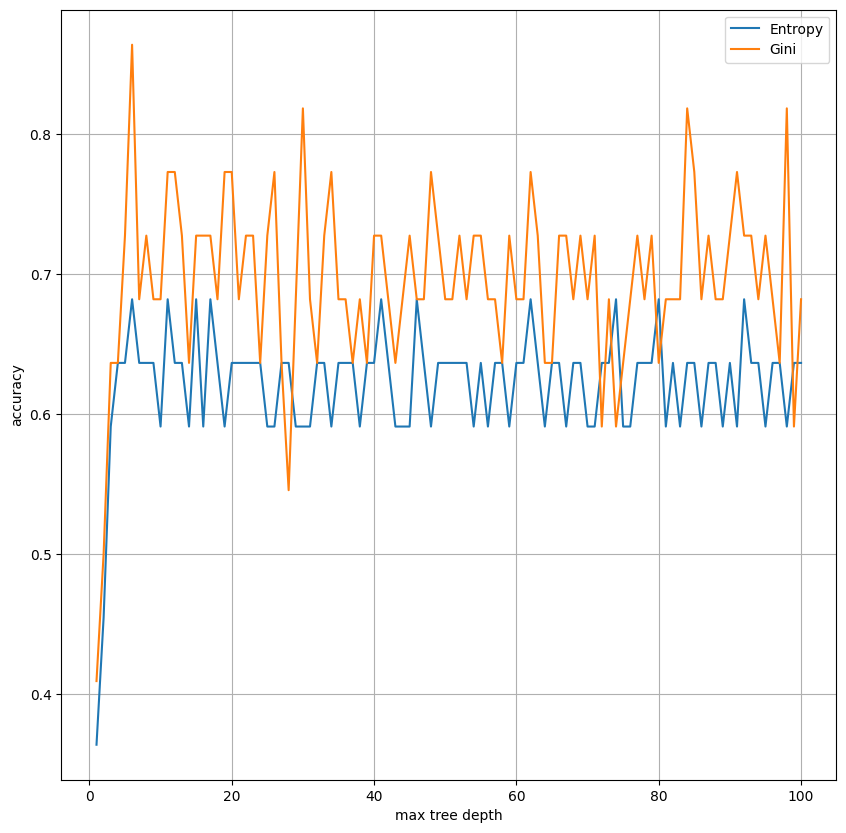

In [105]:
plot_max_tree_depth_of_acc()

In [106]:
tree_task_5 = DecisionTreeClassifier(criterion='entropy')
tree_task_5.fit(x_train_5, y_train_5)


DecisionTreeClassifier(criterion='entropy')

In [107]:
tree_task_5_2 = DecisionTreeClassifier(criterion='gini')
tree_task_5_2.fit(x_train_5, y_train_5)


DecisionTreeClassifier()

In [108]:
from sklearn import tree

[Text(0.36096938775510207, 0.9615384615384616, 'x[2] <= 2.695\nentropy = 2.136\nsamples = 192\nvalue = [65, 69, 14, 11, 7, 26]'),
 Text(0.11224489795918367, 0.8846153846153846, 'x[1] <= 13.785\nentropy = 1.858\nsamples = 52\nvalue = [0, 11, 0, 11, 7, 23]'),
 Text(0.04081632653061224, 0.8076923076923077, 'x[3] <= 1.495\nentropy = 0.998\nsamples = 19\nvalue = [0, 9, 0, 10, 0, 0]'),
 Text(0.02040816326530612, 0.7307692307692307, 'entropy = 0.0\nsamples = 6\nvalue = [0, 6, 0, 0, 0, 0]'),
 Text(0.061224489795918366, 0.7307692307692307, 'x[8] <= 0.085\nentropy = 0.779\nsamples = 13\nvalue = [0, 3, 0, 10, 0, 0]'),
 Text(0.04081632653061224, 0.6538461538461539, 'entropy = 0.0\nsamples = 9\nvalue = [0, 0, 0, 9, 0, 0]'),
 Text(0.08163265306122448, 0.6538461538461539, 'x[8] <= 0.425\nentropy = 0.811\nsamples = 4\nvalue = [0, 3, 0, 1, 0, 0]'),
 Text(0.061224489795918366, 0.5769230769230769, 'entropy = 0.0\nsamples = 3\nvalue = [0, 3, 0, 0, 0, 0]'),
 Text(0.10204081632653061, 0.5769230769230769, 'e

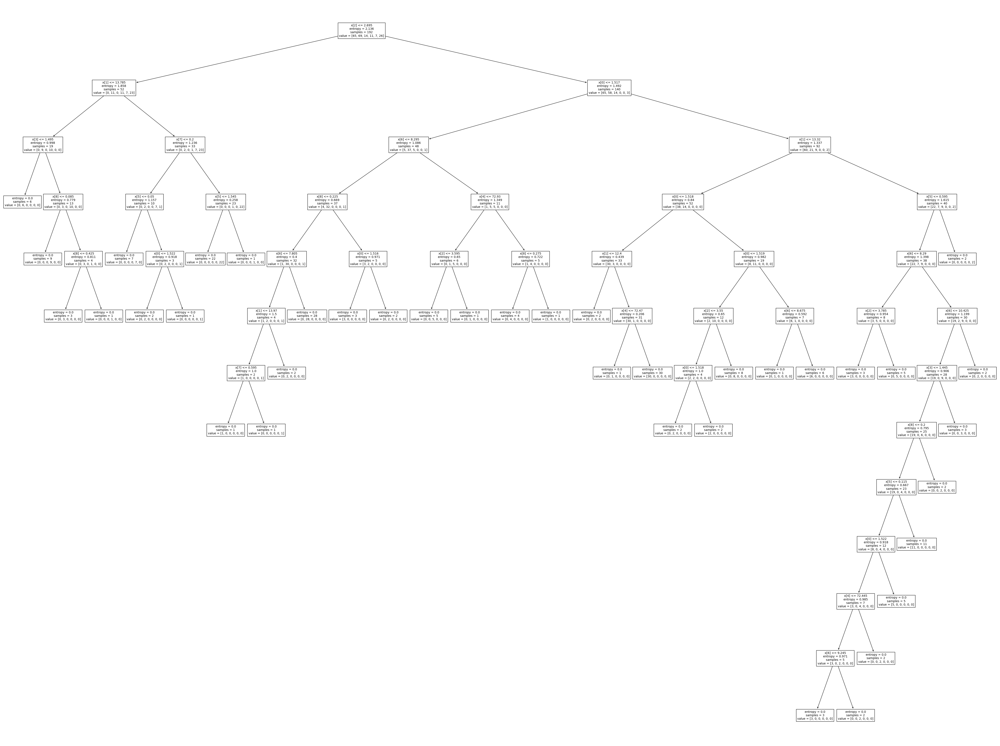

In [109]:
plt.figure(figsize=(60,45))
tree.plot_tree(tree_task_5, fontsize=10)


[Text(0.7055084745762712, 0.9545454545454546, 'x[7] <= 0.335\ngini = 0.728\nsamples = 192\nvalue = [65, 69, 14, 11, 7, 26]'),
 Text(0.501412429378531, 0.8636363636363636, 'x[3] <= 1.42\ngini = 0.667\nsamples = 165\nvalue = [64, 68, 14, 10, 7, 2]'),
 Text(0.3220338983050847, 0.7727272727272727, 'x[6] <= 10.48\ngini = 0.574\nsamples = 100\nvalue = [58, 28, 10, 0, 3, 1]'),
 Text(0.21468926553672316, 0.6818181818181818, 'x[0] <= 1.517\ngini = 0.533\nsamples = 91\nvalue = [58, 20, 10, 0, 2, 1]'),
 Text(0.06779661016949153, 0.5909090909090909, 'x[4] <= 72.72\ngini = 0.694\nsamples = 11\nvalue = [2, 4, 4, 0, 1, 0]'),
 Text(0.04519774011299435, 0.5, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3, 0, 0, 0]'),
 Text(0.0903954802259887, 0.5, 'x[4] <= 72.975\ngini = 0.656\nsamples = 8\nvalue = [2, 4, 1, 0, 1, 0]'),
 Text(0.04519774011299435, 0.4090909090909091, 'x[3] <= 1.305\ngini = 0.32\nsamples = 5\nvalue = [0, 4, 1, 0, 0, 0]'),
 Text(0.022598870056497175, 0.3181818181818182, 'gini = 0.0\nsamples =

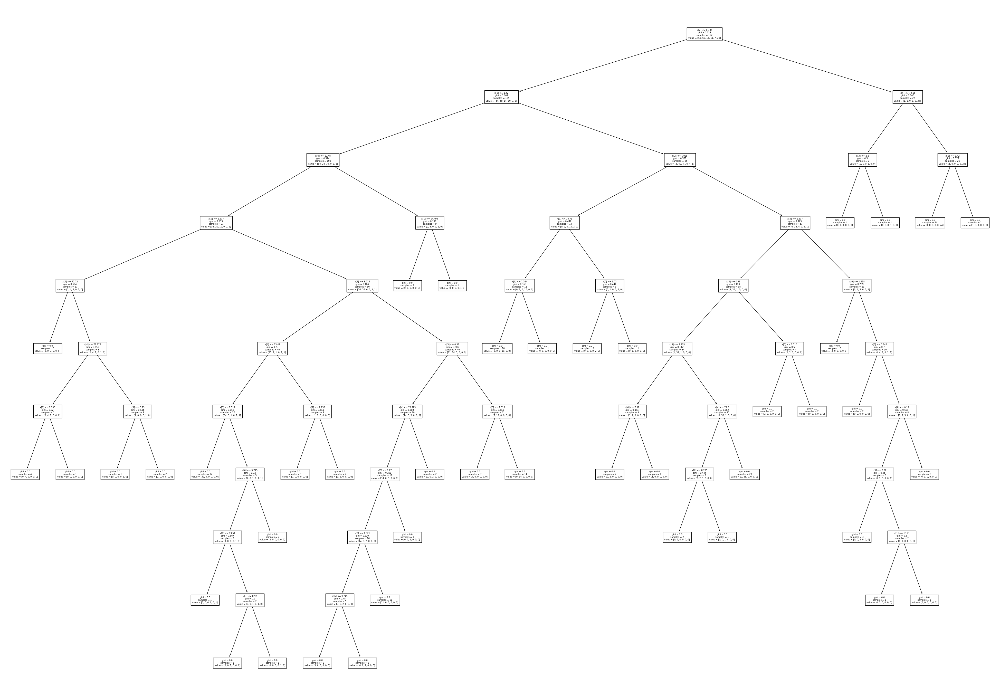

In [110]:
plt.figure(figsize=(50,35))
tree.plot_tree(tree_task_5_2, fontsize=6)

In [111]:
print(get_pred_accuracy(tree_task_5, x_test_5, y_test_5))

0.6363636363636364


In [112]:
print(get_pred_accuracy(tree_task_5_2, x_test_5, y_test_5))

0.6363636363636364


#### b
 - Загрузите набор данных spam7 из файла spam7.csv. 
 - Постройте оптимальное, по вашему мнению, дерево классификации для параметра yesno. 
 - Объясните, как был осуществлён подбор параметров. Визуализируйте результирующее дерево решения. Определите наиболее влияющие признаки. Оцените качество классификации.

In [113]:
# function to load data of spam messages
def load_spam_data_5b():
    data = pd.read_csv("spam7.csv", sep=',').to_numpy()
    X = np.delete(data, -1, axis=1)
    Y = data[:,-1]
    Y[Y == 'y'] = 1
    Y[Y == 'n'] = 0
    Y=Y.astype('int')
    X=X.astype('float')
    return X, Y

X_task_5b, Y_task_5b = load_spam_data_5b()
x_train_5b, x_test_5b, y_train_5b, y_test_5b = train_test_split(X_task_5b, Y_task_5b, test_size=0.13)

In [114]:
tree_5b = DecisionTreeClassifier(max_depth=40, criterion='gini')
tree_5b.fit(x_train_5b, y_train_5b)
print(get_pred_accuracy(tree_5b, x_test_5b, y_test_5b))

plt.figure(figsize=(150,70))
plot_tree(tree_5b, filled=True)
plt.show()

0.8280467445742905


In [118]:
tree_5b_2 = DecisionTreeClassifier(max_depth=15, criterion='entropy')
tree_5b_2.fit(x_train_5b, y_train_5b)
print(get_pred_accuracy(tree_5b_2, x_test_5b, y_test_5b))

plt.figure(figsize=(150,70))
plot_tree(tree_5b_2, filled=True)
plt.show()

0.8447412353923205


In [120]:
tree_5b_3 = DecisionTreeClassifier(max_depth=8, criterion='entropy')
tree_5b_3.fit(x_train_5b, y_train_5b)
print(get_pred_accuracy(tree_5b_3, x_test_5b, y_test_5b))

plt.figure(figsize=(150,70))
plot_tree(tree_5b_3, filled=True)
plt.show()

0.8530884808013356



### Задание 6.	
 - Загрузите набор данных из файла bank_scoring_train.csv. Это набор финансовых данных, характеризующий физических лиц. Целевым столбцом является «SeriousDlqin2yrs», означающий, ухудшится ли финансовая ситуация у клиента. 
 - Постройте систему по принятию решения о выдаче или невыдаче кредита физическому лицу. Сделайте как минимум 2 варианта системы на основе различных классификаторов. 
 - Подберите подходящую метрику качества работы системы исходя из специфики задачи и определите, принятие решения какой системой сработало лучше на bank_scoring_test.csv.

In [32]:
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from matplotlib.pyplot import figure
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import precision_score, recall_score

# Предположим, у вас есть истинные метки (y_true) и предсказанные метки (y_pred)



In [6]:
def get_pred_accuracy(clf, x_test, y_test):
    # clf is classifier
    y_prediction = clf.predict(x_test)
    return accuracy_score(y_test, y_prediction)

In [33]:
def get_pred_precision_recall(clf, x_test, y_test):
    y_prediction = clf.predict(x_test)
    # Вычисление Precision
    precision = precision_score(y_test, y_prediction)

    # Вычисление Recall
    recall = recall_score(y_test, y_prediction)
    return {'Precision': precision, "Recall": recall}

In [7]:
def load_bank_data():
    bank_train = pd.read_csv('bank_scoring_train.csv', sep='\t').to_numpy()
    X_train = bank_train[:, 1:]
    X_train = X_train.astype('float')
    y_train = bank_train[:, 0]
    y_train = y_train.astype('int')
    
    bank_test = pd.read_csv('bank_scoring_test.csv', sep=',').to_numpy()
    bank_test = bank_test[:-2,:]
    X_test = bank_test[:, 1:]
    X_test = X_test.astype('float')
    y_test = bank_test[:, 0]
    y_test = y_test.astype('int')

    return X_train, y_train, X_test, y_test

In [8]:
def plot_confusion_table(clf, x_test, y_test): 
    predictions = clf.predict(x_test)
    conf_matrx= confusion_matrix(y_test, predictions, labels=clf.classes_)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrx,display_labels=clf.classes_)
    disp.plot()

    plt.show()

In [9]:
X_train_6, y_train_6, X_test_6, y_test_6 = load_bank_data()

Выбор наилучшей модели будем основывать на таких метриках как точность и таблица ошибок.

In [10]:
models_6 = (
    GaussianNB(),
    KNeighborsClassifier(n_neighbors=8),
    tree.DecisionTreeClassifier(criterion='gini', max_depth=45),
    svm.SVC(kernel='rbf'),
    )

titles = ('Naive Gaussian', 'K neighbours', 'Desicion tree', 'SVC Gauss')

In [11]:
from tqdm import tqdm
from sklearn.metrics import accuracy_score, classification_report

In [12]:
# train models
for model in tqdm(models_6):
    model.fit(X_train_6, y_train_6)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:19<00:00, 19.95s/it]


In [34]:
def calculate_accuracies_for_model_choose():
    for i in tqdm(range(len(models_6))):
        print(titles[i], get_pred_precision_recall(models_6[i], X_test_6, y_test_6))
        plot_confusion_table(models_6[i], X_test_6, y_test_6)

  0%|                                                                                                                                                                                                                 | 0/4 [00:00<?, ?it/s]

Naive Gaussian {'Precision': 0.41818181818181815, 'Recall': 0.027946537059538274}


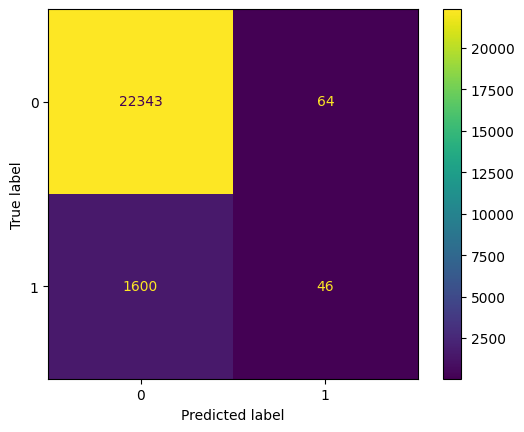

 25%|██████████████████████████████████████████████████▎                                                                                                                                                      | 1/4 [00:00<00:00,  4.38it/s]

K neighbours {'Precision': 0.5841584158415841, 'Recall': 0.035844471445929525}


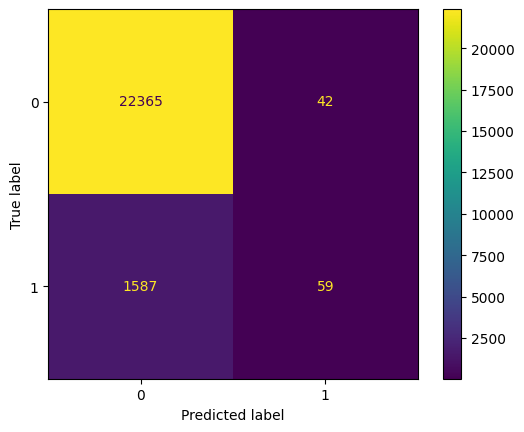

 50%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 2/4 [00:06<00:07,  3.82s/it]

Desicion tree {'Precision': 0.6472642607683353, 'Recall': 0.675577156743621}


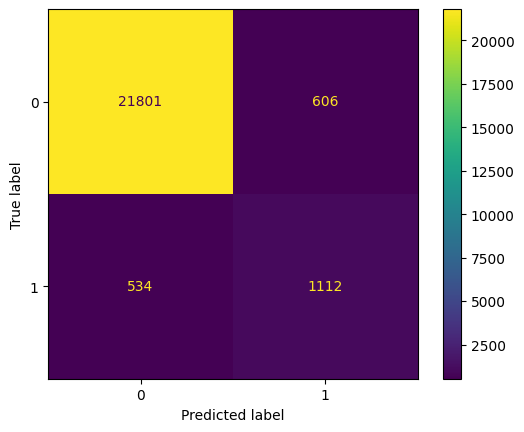

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 3/4 [00:07<00:02,  2.32s/it]

SVC Gauss {'Precision': 0.0, 'Recall': 0.0}


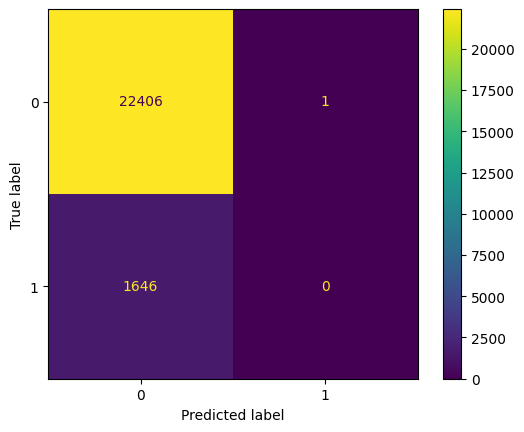

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:47<00:00, 11.77s/it]


In [35]:
calculate_accuracies_for_model_choose()

Вывод: деревья тут справляются лучше всего. Так как мы можем заметить по таблице ошибок, что у нас модель дает сбалансированный результат. Сбалансированный в каком плане: метрика TPR  = precision(точность) = 21786/ (21786 + 621) = 0.9722854465122507 - что очень хорошо, при этом доля неваднных кредитов не очень велика, что соответсвенно хорошо, так как меньше потерянная выгода банка. 21786 / (21786 + 542) = 0.9757255463991401. В других же случаях модели дают дают предсказания казалось бы достаточно неплохо, но если мы посмотрим на этих таблицы ошибок, увидим, что они отклоняют большое количество кредитов безопасных, что несет потери банку в выгоде на заработок, но при этом у них хорошая метрика precision малое число предсказаний о выдаче с потерей выплаты клиентом.

In [132]:
21789 / (21789 + 618)


0.9724193332440755

In [131]:
21789 / (21789 + 546)

0.9755540631296172

In [36]:
1100 / (1100 + 618)

0.640279394644936

In [37]:
1100 / (1100 + 546)

0.6682867557715675